# A Social Dynamics Simulation to understand how opinions spread in a society

In [ ]:
from matplotlib import pyplot as plt
import scipy.stats as sts
import networkx as nx
import random
import numpy as np

### The Python Simulation Class that runs the simulation

In [15]:
class SocialDynamicsSimulation:

    def __init__(self, number_of_opinions,network_size=50, beta= 0.2, gamma=4):
        
        self.network_size = network_size
        self.beta = beta
        self.gamma = gamma
        self.num_of_opinions = number_of_opinions
        self.mean_opinions = []

    def initialize(self):
        
        #Initializing the network and sampling all the parameters
       
        self.graph = nx.barabasi_albert_graph(self.network_size,10)
        
        
            
        for node in self.graph.nodes:
            # Sampling a list of opinions, each drawn from a normal, equal to the number of opinions
            self.graph.nodes[node]['opinion'] = [ sts.norm(0,0.5).rvs() for i in range(self.num_of_opinions)]
            # Sampling persuasiveness parameter
            self.graph.nodes[node]['persuasiveness'] = abs(sts.norm(0.01,0.01).rvs())
            # Sampling personalized alpha for each node
            self.graph.nodes[node]['alpha'] = abs(sts.norm(0.03,0.001).rvs())
        
               
        for edge in self.graph.edges: # Initializing edge weights
            self.graph.edges[edge]['weight'] = abs(sts.norm(0.5,0.2).rvs())
        
        
        self.layout = nx.spring_layout(self.graph)  # Initial visual layout
        self.step = 0
        
        # Setting up the opinion weights as per the formula discussed in the write up.
        self.opinion_weights = [ x*2/(self.num_of_opinions*(self.num_of_opinions+1)) 
                                for x in range(1,self.num_of_opinions+1)]
        
    def observe(self):
        
        #Visualizing the network over all the opinions
     
        for opinion_index in range(self.num_of_opinions): # Plotting the graph for each opinion
            plt.figure(figsize=(5,5))
            self.layout = nx.spring_layout(self.graph, pos = self.layout, iterations=5)
            plt.clf()
            nx.draw(
                self.graph, pos=self.layout, with_labels=True,
                node_color=[ self.graph.nodes[i]['opinion'][opinion_index] for i in self.graph.nodes],
                edge_color=[self.graph.edges[i, j]['weight'] for i, j in self.graph.edges],
                edge_cmap= plt.cm.binary, edge_vmin=0, edge_vmax=1,
                alpha=0.7, vmin=0, vmax=1)
            plt.title('Step: ' + str(self.step))
            plt.show()

    def update(self): 
        
        probability = random.uniform(0, 1)
        
        if probability < 0.001: 
          
        # A random connection with a 0.1% probability
        
            nodes = list(self.graph.nodes)
            
            while True:
                new_edge = random.sample(nodes, 2) # Sampling two random nodes to connect
                if new_edge not in self.graph.edges:
                    break
            self.graph.add_edge(new_edge[0], new_edge[1], weight=0.5) # Adding the edge
            
        
        elif probability < 0.01:
        
        # An introduction to a friend's friend with 1% probability
        
            node = random.choice(list(self.graph.nodes))
            
            # Building a list of nodes that are the neighbors of the neighbors
            
            second_neighbors = []
            
            for neighbor in list(self.graph.neighbors(node)):
                second_network = list(self.graph.neighbors(neighbor))
                second_neighbors += second_network
            
            second_neighbors = list(set(second_neighbors))
            
            # Removing any first degree neighbors that are already friends with our node
            
            for neighbor in list(self.graph.neighbors(node)):
                if neighbor in second_neighbors:
                    second_neighbors.remove(neighbor)
            
            
            if second_neighbors != []:
                new_neighbor = random.choice(second_neighbors)
            
            # It may happen that the node doesn't have any considerable second neighbors
            
            else:
                new_neighbor = random.choice(list(self.graph.nodes))
                
            # Adding the edge
                    
            self.graph.add_edge(node, new_neighbor, weight= sts.norm(0.5,0.2).rvs())
                    
            
        else: # Interaction
            
            #Extracting info on the nodes
            edge = random.choice(list(self.graph.edges))
            weight = self.graph.edges[edge]['weight']
            persuasiveness = [self.graph.nodes[n]['persuasiveness'] for n in edge]
            
            # Choosing a particular opinion to interact on
            
            opinion_index = random.choice(range(self.num_of_opinions))
            
            # Extracting opinions and their differences
            opinions = [self.graph.nodes[n]['opinion'][opinion_index] for n in edge]
            difference = abs(opinions[1] - opinions[0])
            
            
            #Implementing the formula for change in opinions. 
            # Persuasiveness and personalized alpha's have been added here
            for i in [0, 1]:
                self.graph.nodes[edge[i]]['opinion'][opinion_index] = (
                    opinions[i] + self.graph.nodes[edge[i]]['alpha'] * 
                    weight * (opinions[1-i] - opinions[i])) * (1 + persuasiveness[1-i])
            
            # Weighted difference of opinion
            difference = self.opinion_weights[opinion_index]*difference
                
            # Implementing change in the weights
            self.graph.edges[edge]['weight'] = (
                weight +
                self.beta * weight * (1-weight) *
                (1 - self.gamma * difference))
            
            
            # Remove very weak connections
            if self.graph.edges[edge]['weight'] < 0.05:
                self.graph.remove_edge(*edge)
        self.step += 1
    
  
   
    ##The section below is used for tracking metrics and their visualization
   
    
    def average_opinions(self):
        all_opinions = []
        
        # Collecting all the opinions at a particular time step
        
        for opinion_index in range(self.num_of_opinions):
            opinions = []
            for j in range(len(list(self.graph.nodes))):
                opinions.append(self.graph.nodes[j]['opinion'][opinion_index])
            all_opinions.append(opinions)
        
        # Taking the mean of the opinions
        
        mean_opinions = [np.mean(i) for i in all_opinions]
        
        # Collecting the means
        
        self.mean_opinions.append(mean_opinions)
        
        
    def draw_priors(self):
        persuasiveness = []
        alphas = []
        
        # Collecting the persusiveness and alpha parameters for each node
        
        for j in range(len(list(self.graph.nodes))):
            alphas.append(self.graph.nodes[j]['alpha'])
            persuasiveness.append(self.graph.nodes[j]['persuasiveness'])
        
        self.persuasiveness = persuasiveness
        self.alphas = alphas

### Running the simulation and plotting every 100th step of the network: The colors represent the mean opinion of the node. 

it is interesting to note how the colors alternate, which is analogous to cycles of rise of left Vs. right wing ideologies

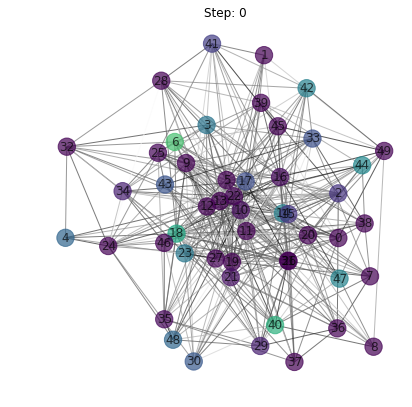

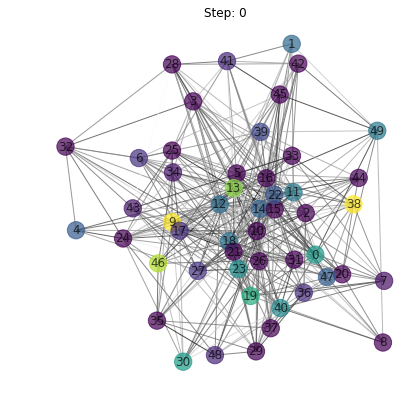

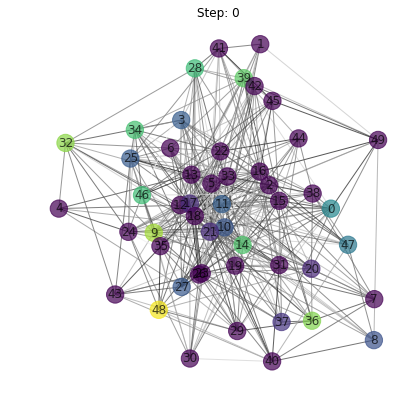

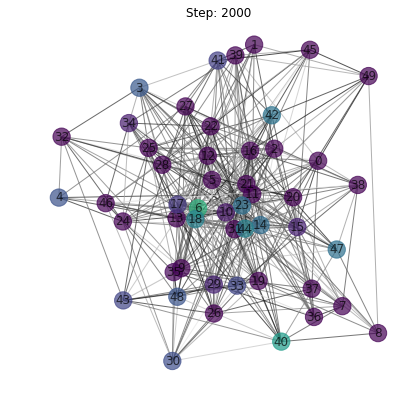

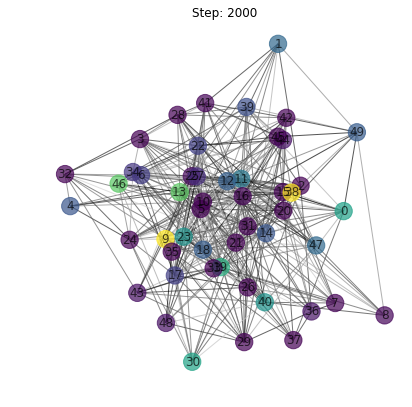

...

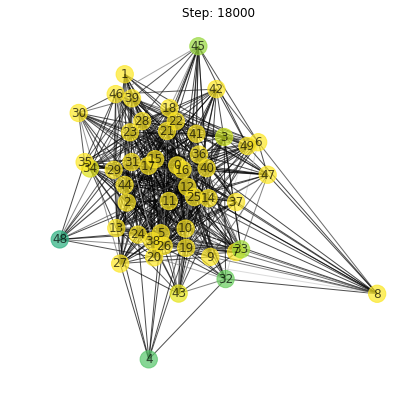

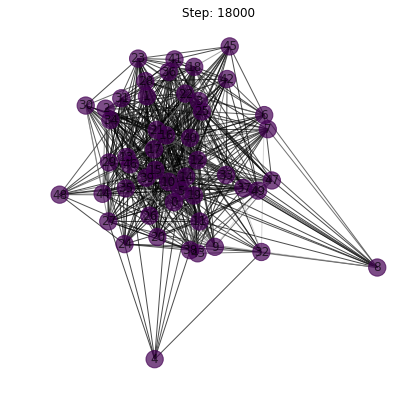

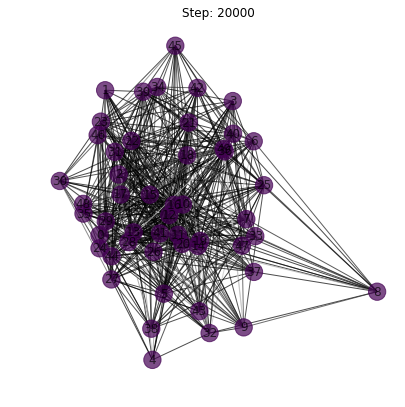

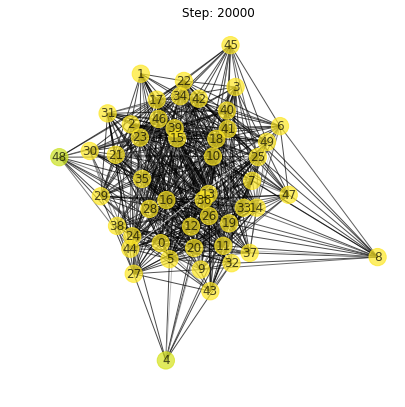

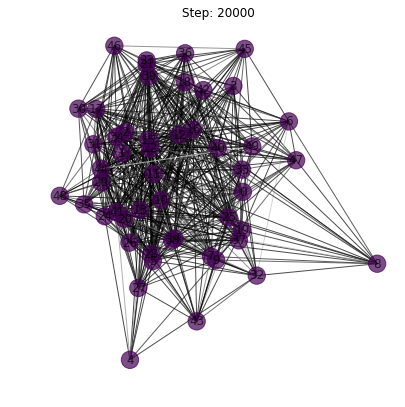

In [16]:
# Initial simulation and observation across all opinions for 20000 steps

sim = SocialDynamicsSimulation(number_of_opinions = 3)
sim.initialize()
sim.average_opinions()
sim.observe()
for i in range(10):
    for i in range(2000):
        sim.average_opinions()
        sim.update()
    sim.observe()

### Plotting variation of mean opinions across 1000 steps

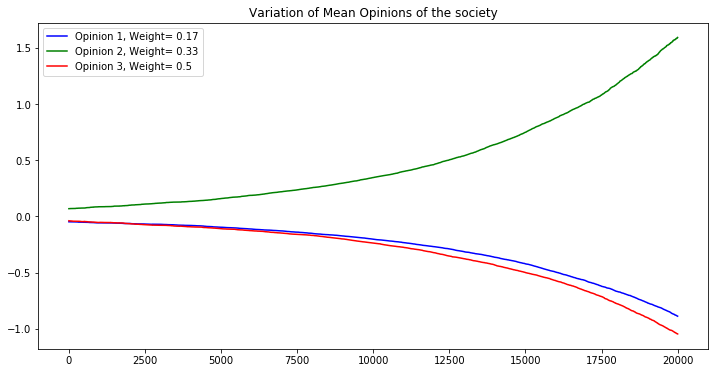

In [17]:
# Extracting the data on the mean opinions and plotting them together

opinions = np.array(sim.mean_opinions)
weights = sim.opinion_weights

plt.figure(figsize=(12,6))
plt.title('Variation of Mean Opinions of the society')

# Plotting each opinion with their weights

plt.plot(range(20001),opinions[:,0],label='Opinion 1, Weight= {}'.format(round(weights[0],2)),color='blue')

plt.plot(range(20001),opinions[:,1],label='Opinion 2, Weight= {}'.format(round(weights[1],2)),color='green')

plt.plot(range(20001),opinions[:,2],label='Opinion 3, Weight= {}'.format(round(weights[2],2)),color='red')
plt.legend()
plt.show()

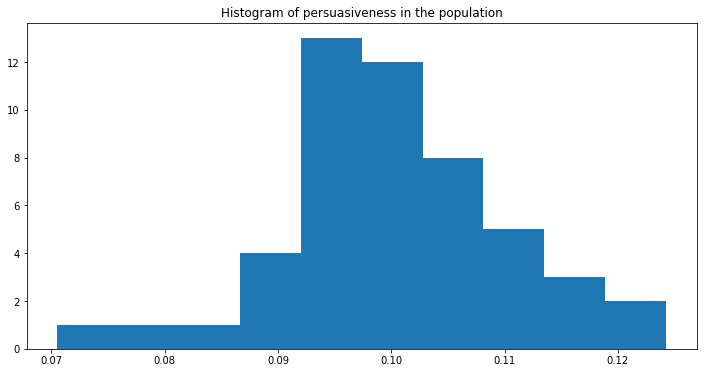

In [5]:
# Plotting the persuasiveness distribution

sim.draw_priors()
persuasiveness = sim.persuasiveness
plt.figure(figsize=(12,6))
plt.hist(persuasiveness)
plt.title('Histogram of persuasiveness in the population')
plt.show()

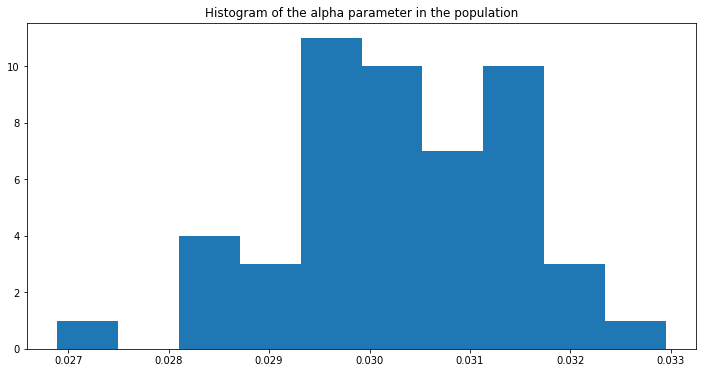

In [6]:
# Plotting the distribution of the alpha parameter

alphas = sim.alphas
plt.figure(figsize=(12,6))
plt.hist(alphas)
plt.title('Histogram of the alpha parameter in the population')
plt.show()

# Vector fields

In [7]:
# Initializing the values of difference in opinions and weights within a suitable range

change_opinions = np.linspace(-2,2,10)
weights = np.linspace(0,1,10)

# Building the meshgrid

x_grid, y_grid = np.meshgrid(change_opinions,weights)

In [8]:
# The functions for the change in opinion and the change in weights

def delta_o(change,weight):
    alpha = sts.norm(0.3,0.001).rvs()
    persuasiveness = sts.norm(0.01,0.01).rvs()
    return (alpha) * weight * (change) * (1+persuasiveness)

def delta_w(change,weight,opinion_weight = 0.5):
    return 0.2 * weight * (1-weight) *(1 - 4 * change*opinion_weight)

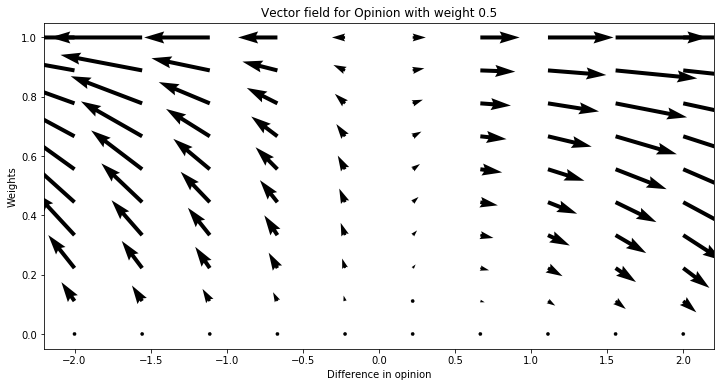

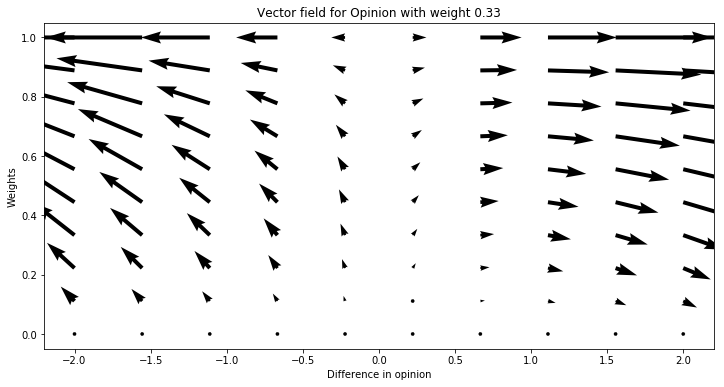

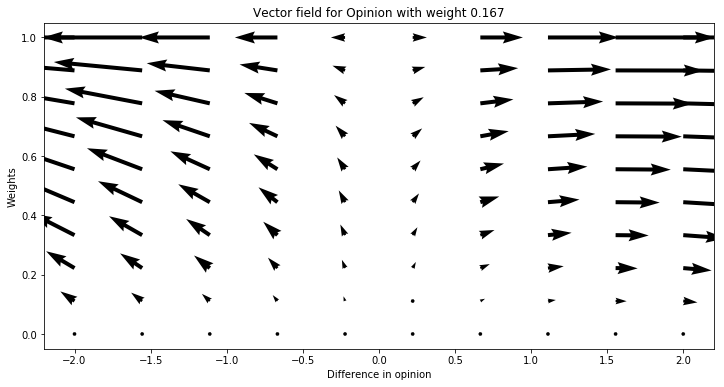

In [9]:
# For each opinion, we construct the vectors from the functions we built above

for opinion_wt in [0.5,0.33,0.167]:
    # Vectors
    vector_x = delta_o(x_grid,y_grid)
    vector_y = delta_w(x_grid,y_grid,opinion_weight=opinion_wt)

    # Plotting the vector field through a quiver plot
    plt.figure(figsize=(12, 6))
    plt.quiver(x_grid, y_grid, vector_x, vector_y)
    plt.title('Vector field for Opinion with weight {}'.format(opinion_wt))
    plt.xlabel('Difference in opinion')
    plt.ylabel('Weights')
    plt.show()

# Local Analysis

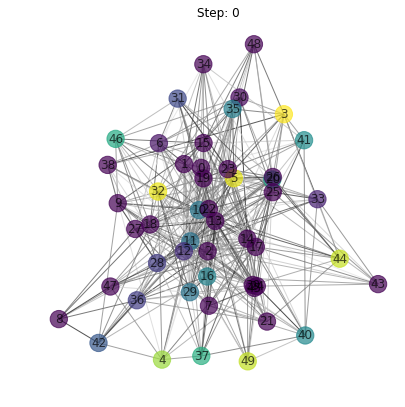

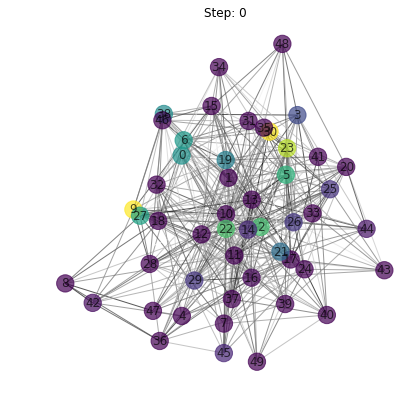

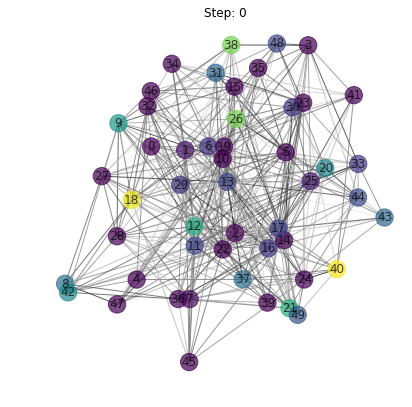

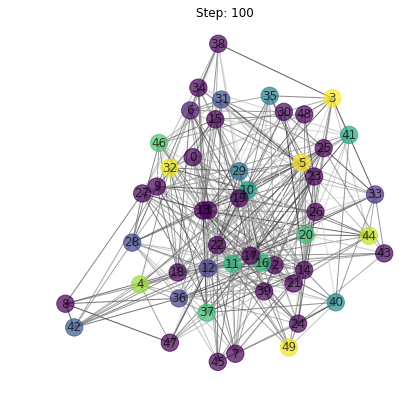

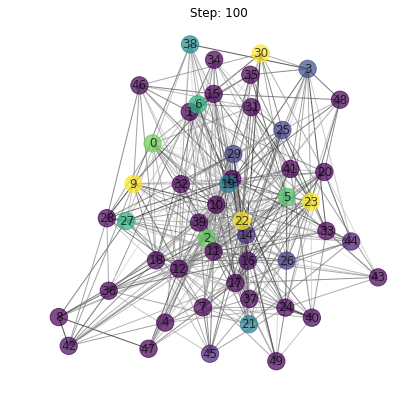

...

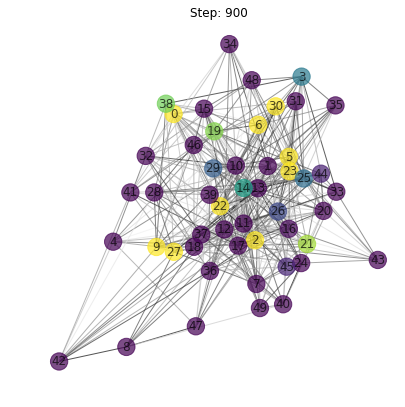

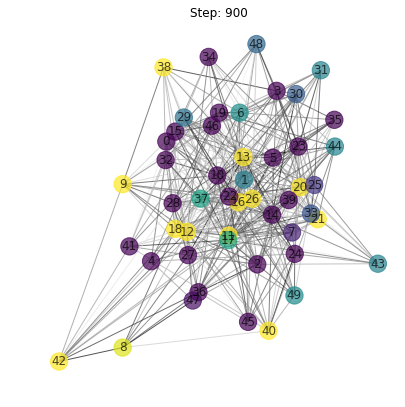

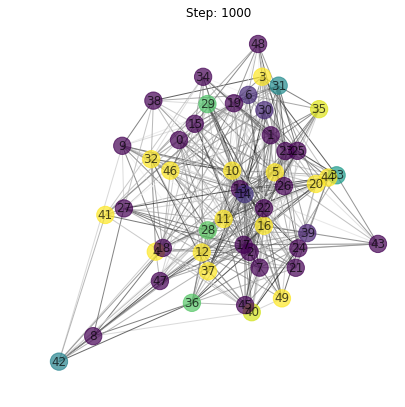

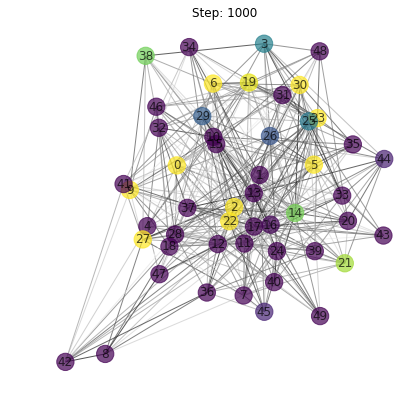

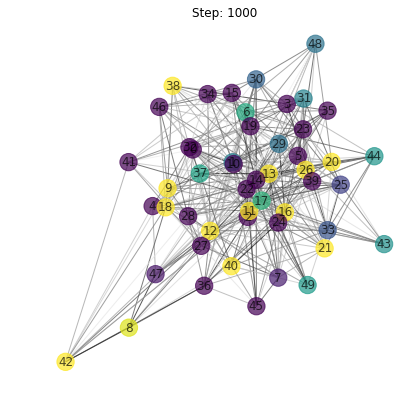

In [11]:
# Simulating a smaller network and observing the chnages over time

sim_local = SocialDynamicsSimulation(number_of_opinions = 3)
sim_local.initialize()
sim_local.average_opinions()
sim_local.observe()
for i in range(10):
    for i in range(100):
        sim_local.average_opinions()
        sim_local.update()
    sim_local.observe()

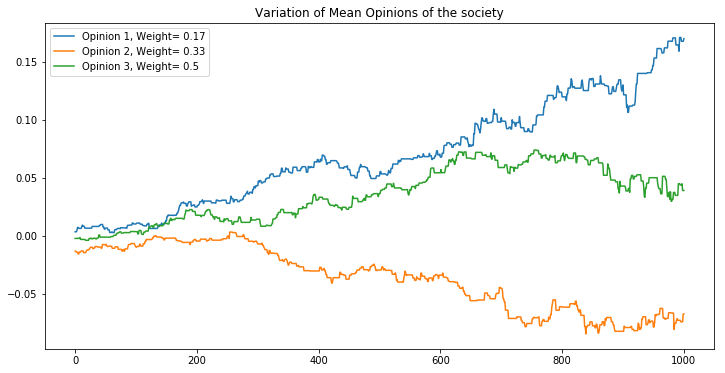

In [12]:
# Plotting the divergence of the opinions of the network in the local analysis

opinions = np.array(sim_local.mean_opinions)
weights = sim_local.opinion_weights
plt.figure(figsize=(12,6))
plt.title('Variation of Mean Opinions of the society')
plt.plot(range(1001),opinions[:,0],label='Opinion 1, Weight= {}'.format(round(weights[0],2)))

plt.plot(range(1001),opinions[:,1],label='Opinion 2, Weight= {}'.format(round(weights[1],2)))

plt.plot(range(1001),opinions[:,2],label='Opinion 3, Weight= {}'.format(round(weights[2],2)))

plt.legend()
plt.show()

# Analysis of Opinion Convergence

In [18]:
# Calculating the final mean opinions for multiple simualtions to observe how opinions diverge

final_opinions = []

for i in range(100): # For 100 simulations
    
    sim_local = SocialDynamicsSimulation(number_of_opinions = 3)
    sim_local.initialize()
    sim_local.average_opinions()
    
    for j in range(1000): # 1000 updates in each simulation
        sim_local.update()
        sim_local.average_opinions()
    
    final_opinions.append(sim_local.mean_opinions[-1])

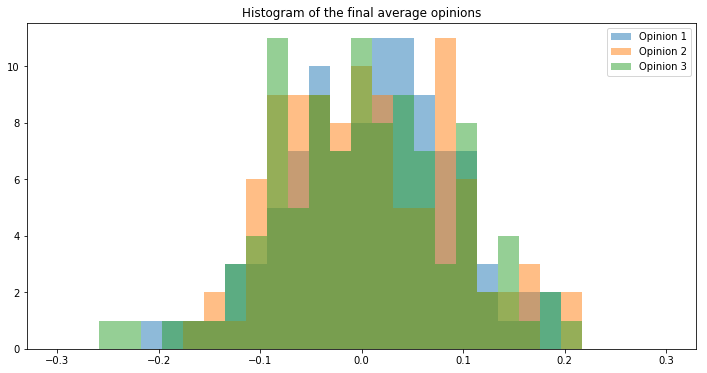

In [19]:
# Histograms of the mean opinions over multiple simulations

final_opinions = np.array(final_opinions)
plt.figure(figsize=(12,6))
plt.hist(final_opinions[:,0],label='Opinion 1',alpha=0.5, bins= np.linspace(-0.3,0.3,30) )
plt.hist(final_opinions[:,1],label='Opinion 2',alpha=0.5, bins= np.linspace(-0.3,0.3,30) )
plt.hist(final_opinions[:,2],label='Opinion 3',alpha=0.5, bins= np.linspace(-0.3,0.3,30) )
plt.title('Histogram of the final average opinions')
plt.legend()
plt.show()